In [1]:
import torch
import pathlib
import cv2
import PIL
import numpy as np
import pandas as pd
import geopandas as gpd
import shapely
import shapely.wkt
import shapely.ops
import matplotlib.pyplot as plt
import time
import csv
from tqdm import tqdm
import utm
%matplotlib inline
import passion.util

import passion.segmentation
from passion.segmentation import prediction

In [2]:
device = ('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
models_folder_path = pathlib.Path('../../workflow/output/model')
old_rooftop_models_folder_path = models_folder_path / 'old-rooftop-segmentation'
rooftop_models_folder_path = models_folder_path / 'rooftop-segmentation'

model_inria_final = torch.load(str(rooftop_models_folder_path / 'inria-aug-12e.pth'), map_location=torch.device(device))
model_inria_aug_10e = torch.load(str(old_rooftop_models_folder_path / 'inria-aug-10e.pth'), map_location=torch.device(device))

In [4]:
inria_val_folder = pathlib.Path('/storage/internal/home/r-pueblas/projects/rooftop-segmentation-datasets/data/INRIA/output/val')
inria_val_folder_image = inria_val_folder / 'image'
inria_val_folder_label = inria_val_folder / 'label'

rid_test_folder = pathlib.Path('/storage/internal/home/r-pueblas/projects/rooftop-segmentation-datasets/data/RID/output/masks_segments_reviewed/test')
rid_test_folder_image = rid_test_folder / 'image'
rid_test_folder_label = rid_test_folder / 'label'

airs_test_path = pathlib.Path('/storage/internal/data/r-pueblas/airs/test')
airs_image_path = airs_test_path / 'image'
airs_label_path = airs_test_path / 'label'

In [5]:
def intersect_and_union(pred_label, label, num_classes, ignore_index):
    mask = (label != ignore_index)
    pred_label = pred_label[mask]
    label = label[mask]

    intersect = pred_label[pred_label == label]
    area_intersect, _ = np.histogram(
        intersect, bins=np.arange(num_classes + 1))
    area_pred_label, _ = np.histogram(
        pred_label, bins=np.arange(num_classes + 1))
    area_label, _ = np.histogram(label, bins=np.arange(num_classes + 1))
    area_union = area_pred_label + area_label - area_intersect

    return area_intersect, area_union, area_pred_label, area_label

In [6]:
def test_model_rooftops(model, test_folder, num_classes, background_class, ignore_index, num_samples = 15, output=True):
    start = time.time()
    
    test_folder_image = test_folder / 'image'
    test_folder_label = test_folder / 'label'

    total_area_intersect = np.zeros((num_classes, ), dtype=float)
    total_area_union = np.zeros((num_classes, ), dtype=float)
    total_area_pred_label = np.zeros((num_classes, ), dtype=float)
    total_area_label = np.zeros((num_classes, ), dtype=float)

    for i, filename in enumerate(test_folder_image.glob('*.png')):
        if i>num_samples: break

        image = cv2.imread(str(filename))
        label = cv2.imread(str(test_folder_label / filename.name))
        label = label[:,:,0]

        pred = prediction.segment_img(image, model, tile_size=512, stride=512, background_class=background_class)

        area_intersect, area_union, area_pred_label, area_label = \
                            intersect_and_union(pred, label, num_classes, ignore_index)
        total_area_intersect += area_intersect
        total_area_union += area_union
        total_area_pred_label += area_pred_label
        total_area_label += area_label

        if output:
            f, axarr = plt.subplots(1,3, figsize=(10, 10))
            axarr[0].imshow(image)
            axarr[1].imshow(label)
            axarr[2].imshow(pred)
            if i==0:
                axarr[0].title.set_text('Image')
                axarr[1].title.set_text('Ground truth')
                axarr[2].title.set_text('aug_10e')

            plt.subplots_adjust(wspace=0.1, hspace=0.1)
            for ax in axarr:
                ax.axis('off')
            plt.show()

        iou = total_area_intersect / total_area_union
        if output: print(f'Processed image {filename.stem}, partial mean iou: {np.mean(iou[~np.isnan(iou)])}')

    all_acc = total_area_intersect.sum() / total_area_label.sum()
    acc = total_area_intersect / total_area_label
    iou = total_area_intersect / total_area_union

    end = time.time()
    elapsed_time = (end - start)

    if output:
        print('\n')
        print(f'Elapsed time: {elapsed_time} seconds')
        print(f'Final IoU per class: {iou}')
        print(f'Final mean IoU: {np.mean(iou)}')
    
    return iou, np.mean(iou[~np.isnan(iou)]), elapsed_time

def test_model_rid(model, test_folder, num_classes, rid_background_class, background_class, ignore_index, num_samples = 15, output=True):
    start = time.time()
    
    test_folder_image = test_folder / 'image'
    test_folder_label = test_folder / 'label'

    total_area_intersect = np.zeros((num_classes, ), dtype=float)
    total_area_union = np.zeros((num_classes, ), dtype=float)
    total_area_pred_label = np.zeros((num_classes, ), dtype=float)
    total_area_label = np.zeros((num_classes, ), dtype=float)

    for i, filename in enumerate(test_folder_image.glob('*.png')):
        if i>num_samples: break
        image = cv2.imread(str(filename))
        label = cv2.imread(str(test_folder_label / filename.name))
        label = label[:,:,0]
        
        label[label != rid_background_class] = 1
        label[label == rid_background_class] = 0

        pred = prediction.segment_img(image, model, tile_size=512, stride=512, background_class=background_class)

        area_intersect, area_union, area_pred_label, area_label = \
                            intersect_and_union(pred, label, num_classes, ignore_index)
        total_area_intersect += area_intersect
        total_area_union += area_union
        total_area_pred_label += area_pred_label
        total_area_label += area_label

        if output:
            f, axarr = plt.subplots(1,3, figsize=(10, 10))
            axarr[0].imshow(image)
            axarr[1].imshow(label)
            axarr[2].imshow(pred)
            if i==0:
                axarr[0].title.set_text('Image')
                axarr[1].title.set_text('Ground truth')
                axarr[2].title.set_text('aug_10e')

            plt.subplots_adjust(wspace=0.1, hspace=0.1)
            for ax in axarr:
                ax.axis('off')
            plt.show()

        iou = total_area_intersect / total_area_union
        if output: print(f'Processed image {filename.stem}, partial mean iou: {np.mean(iou[~np.isnan(iou)])}')

    all_acc = total_area_intersect.sum() / total_area_label.sum()
    acc = total_area_intersect / total_area_label
    iou = total_area_intersect / total_area_union

    end = time.time()
    elapsed_time = (end - start)

    if output:
        print('\n')
        print(f'Elapsed time: {elapsed_time} seconds')
        print(f'Final IoU per class: {iou}')
        print(f'Final mean IoU: {np.mean(iou)}')
    
    return iou, np.mean(iou[~np.isnan(iou)]), elapsed_time

def test_model_airs(model, test_folder, scale_percent, num_classes, background_class, ignore_index, output=True, n_samples=15):
    start = time.time()
    
    test_folder_image = test_folder / 'image'
    test_folder_label = test_folder / 'label'

    total_area_intersect = np.zeros((num_classes, ), dtype=float)
    total_area_union = np.zeros((num_classes, ), dtype=float)
    total_area_pred_label = np.zeros((num_classes, ), dtype=float)
    total_area_label = np.zeros((num_classes, ), dtype=float)

    for i, filename in enumerate(test_folder_image.glob('*.tif')):
        if n_samples and (n_samples<=i): break
        image = cv2.imread(str(filename))
        label = cv2.imread(str(test_folder_label / filename.name))
        label = label[:,:,0]
    
        width = int(image.shape[1] * scale_percent / 100)
        height = int(image.shape[0] * scale_percent / 100)
        dsize = (width, height)
        img = cv2.resize(image, dsize)
        label = cv2.resize(label, dsize)

        pred = prediction.segment_img(img, model, tile_size=512, stride=512, background_class=background_class)

        area_intersect, area_union, area_pred_label, area_label = \
                            intersect_and_union(pred, label, num_classes, ignore_index)
        total_area_intersect += area_intersect
        total_area_union += area_union
        total_area_pred_label += area_pred_label
        total_area_label += area_label

        if output:
            f, axarr = plt.subplots(1,3, figsize=(10, 10))
            axarr[0].imshow(image)
            axarr[1].imshow(label)
            axarr[2].imshow(pred)
            if i==0:
                axarr[0].title.set_text('Image')
                axarr[1].title.set_text('Ground truth')
                axarr[2].title.set_text('aug_10e')

            plt.subplots_adjust(wspace=0.1, hspace=0.1)
            for ax in axarr:
                ax.axis('off')
            plt.show()

        iou = total_area_intersect / total_area_union
        if output: print(f'Processed image {filename.stem}, partial mean iou: {np.mean(iou[~np.isnan(iou)])}')

    all_acc = total_area_intersect.sum() / total_area_label.sum()
    acc = total_area_intersect / total_area_label
    iou = total_area_intersect / total_area_union

    end = time.time()
    elapsed_time = (end - start)

    if output:
        print('\n')
        print(f'Elapsed time: {elapsed_time} seconds')
        print(f'Final IoU per class: {iou}')
        print(f'Final mean IoU: {np.mean(iou)}')
    
    return iou, np.mean(iou[~np.isnan(iou)]), elapsed_time

In [7]:
num_classes = 2
background_class = 0
ignore_index = -1
rid_background_class = 17
scale_percent = 25

# INRIA

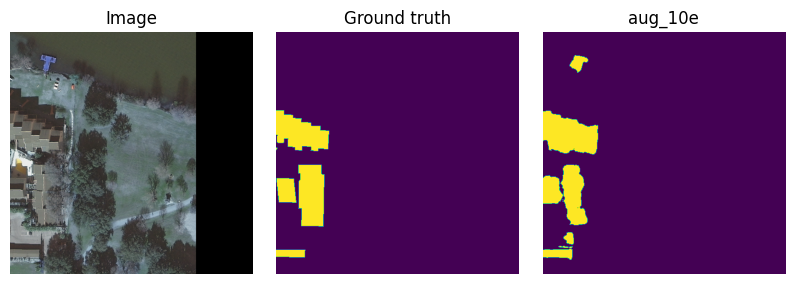

Processed image austin21_4096_4608, partial mean iou: 0.8211998387039575


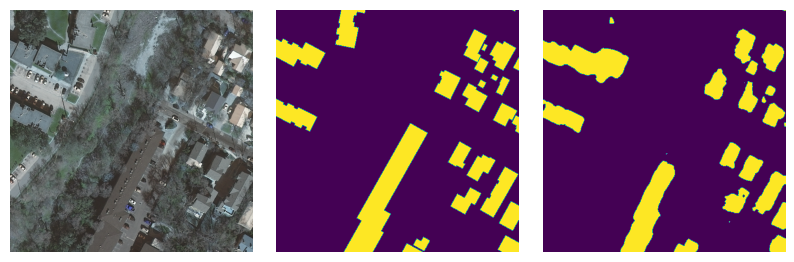

Processed image austin11_2560_3072, partial mean iou: 0.7369644282545533


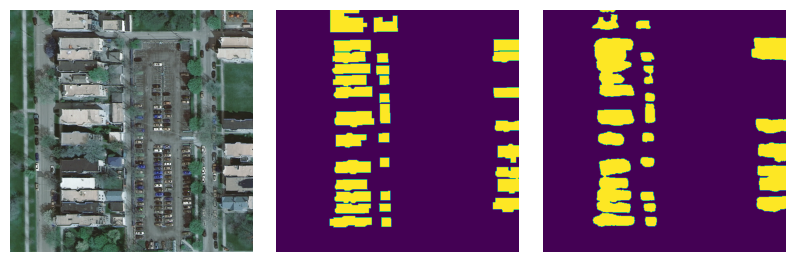

Processed image chicago12_1024_2560, partial mean iou: 0.7388471862197367


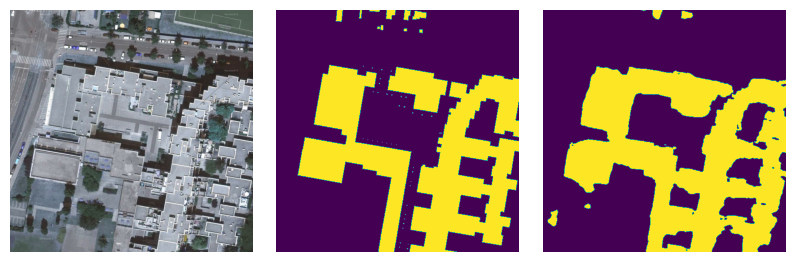

Processed image vienna34_2560_0, partial mean iou: 0.7829409949231867


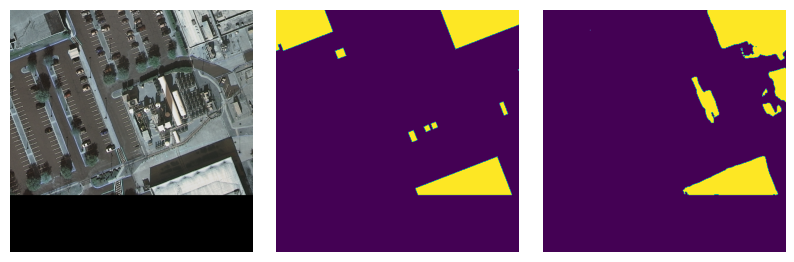

Processed image austin25_4608_1024, partial mean iou: 0.7749429816590947


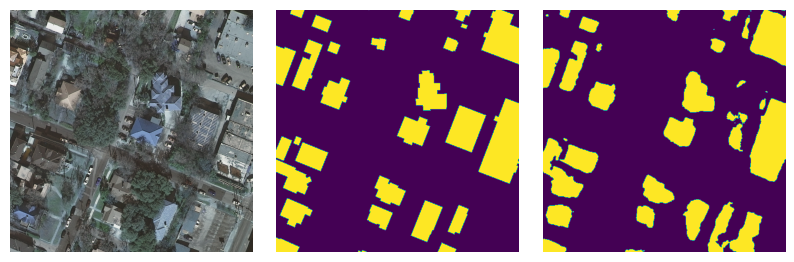

Processed image austin17_3584_1024, partial mean iou: 0.7807946815368014


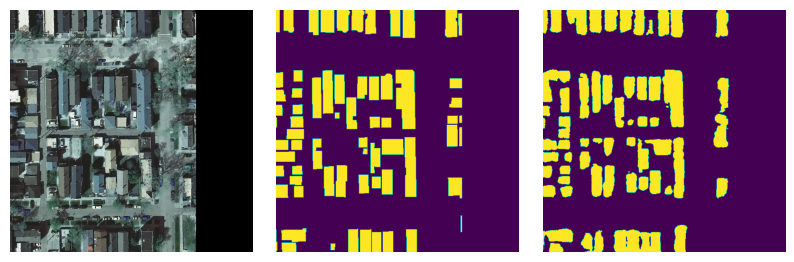

Processed image chicago8_1024_4608, partial mean iou: 0.7860719144348807


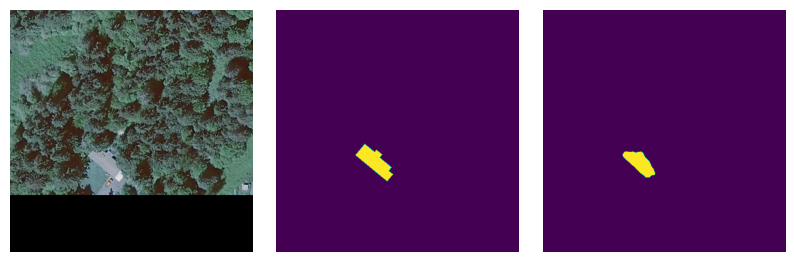

Processed image kitsap17_4608_512, partial mean iou: 0.7919746834453512


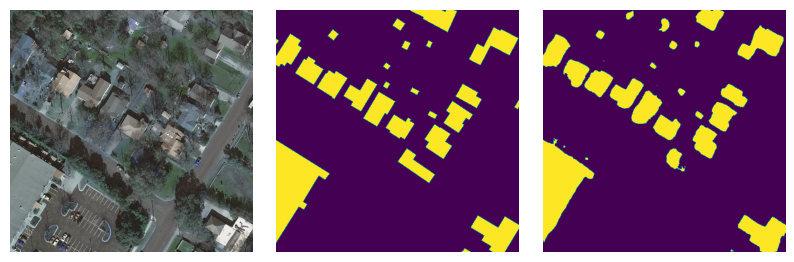

Processed image austin13_1024_0, partial mean iou: 0.8029104482074036


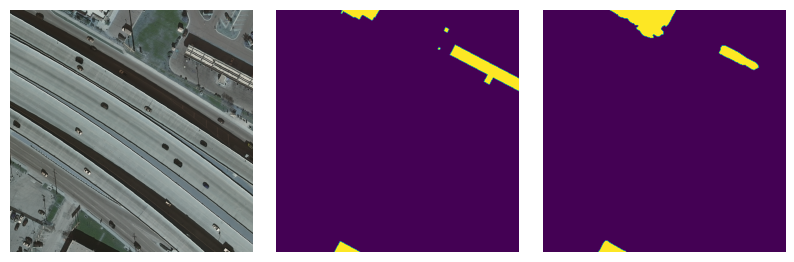

Processed image austin13_4096_512, partial mean iou: 0.8019762362561058


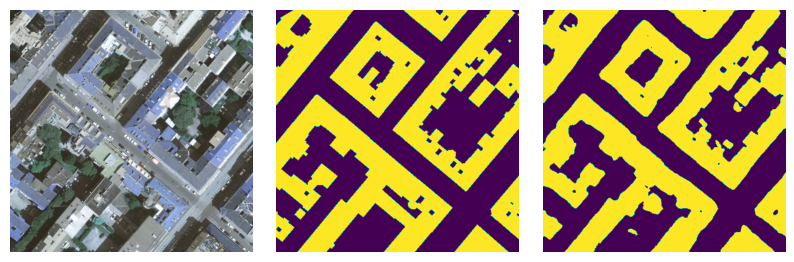

Processed image vienna10_1024_2048, partial mean iou: 0.818973417290213


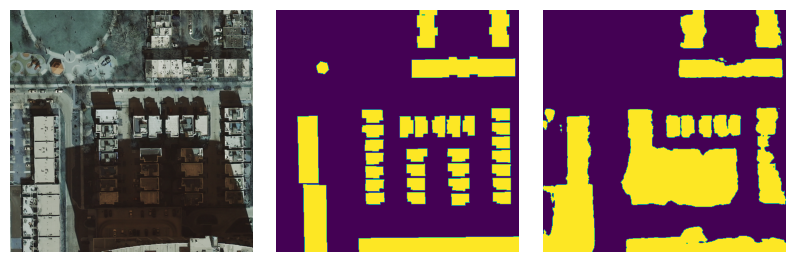

Processed image chicago33_1024_2560, partial mean iou: 0.809578426244644


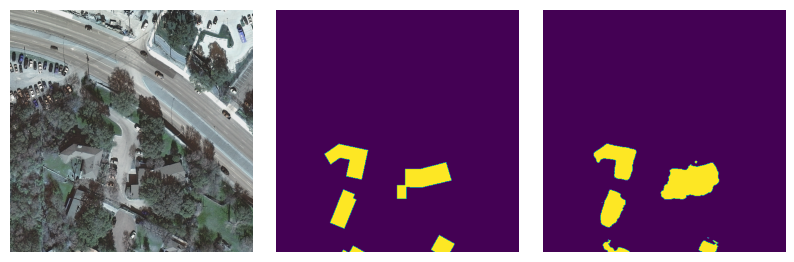

Processed image austin21_3584_2560, partial mean iou: 0.8125279186051404


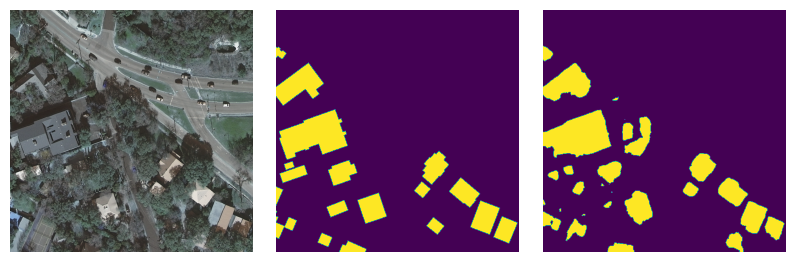

Processed image austin17_1536_1024, partial mean iou: 0.8112130918039784


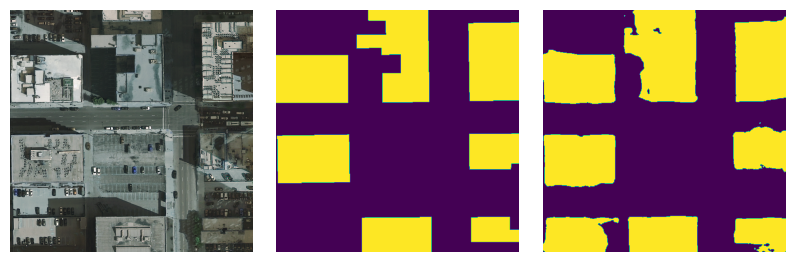

Processed image chicago28_0_3584, partial mean iou: 0.8164736890229901


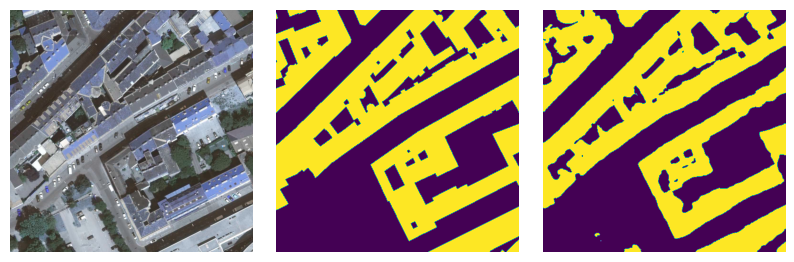

Processed image vienna20_3072_3072, partial mean iou: 0.8208573487526647


Elapsed time: 12.487900018692017 seconds
Final IoU per class: [0.91870389 0.72301081]
Final mean IoU: 0.8208573487526647
Mean IoU: 0.8208573487526647
IoU per class: [0.91870389 0.72301081]
Elapsed time: 12.487900018692017 seconds.


In [8]:
iou, mean_iou, elapsed_time = test_model_rooftops(model_inria_final,
                                                     inria_val_folder,
                                                     num_classes,
                                                     background_class,
                                                     ignore_index,
                                                     output=True)

print(f'Mean IoU: {mean_iou}')
print(f'IoU per class: {iou}')
print(f'Elapsed time: {elapsed_time} seconds.')

# RID

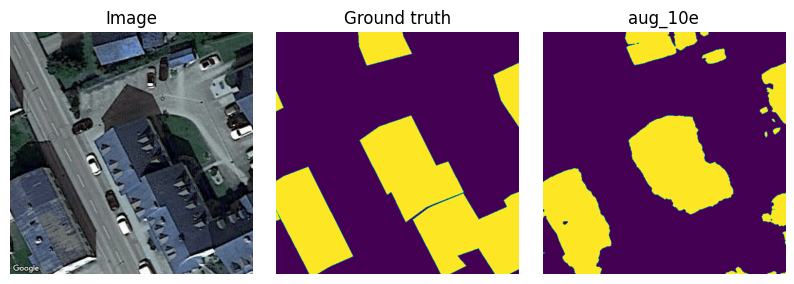

Processed image 1277, partial mean iou: 0.7217304257688781


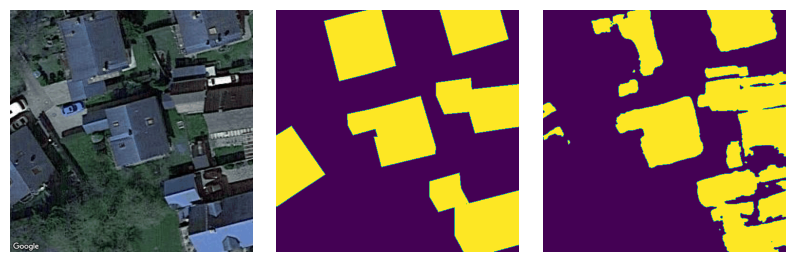

Processed image 1080, partial mean iou: 0.7138190396527895


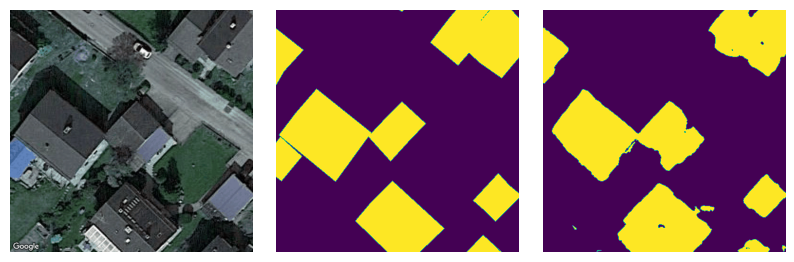

Processed image 785, partial mean iou: 0.7569816211959428


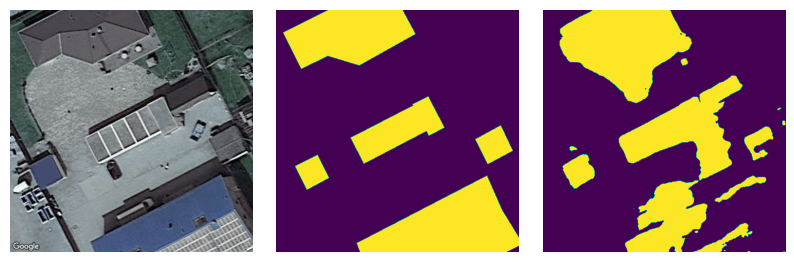

Processed image 1780, partial mean iou: 0.7208045832715662


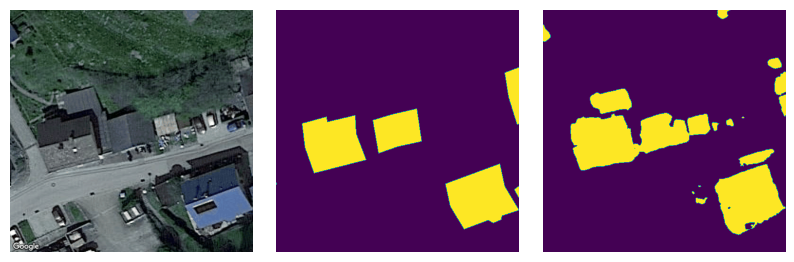

Processed image 1319, partial mean iou: 0.737151530674514


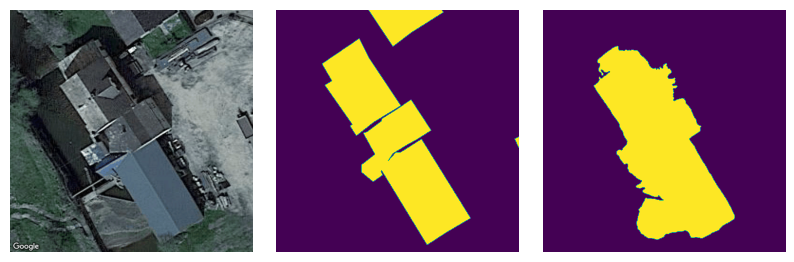

Processed image 1719, partial mean iou: 0.7439211114371693


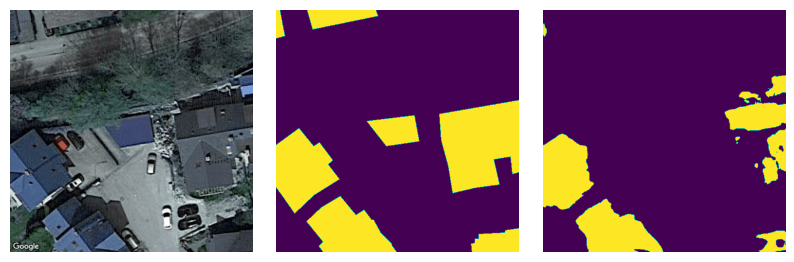

Processed image 1232, partial mean iou: 0.7341541137932088


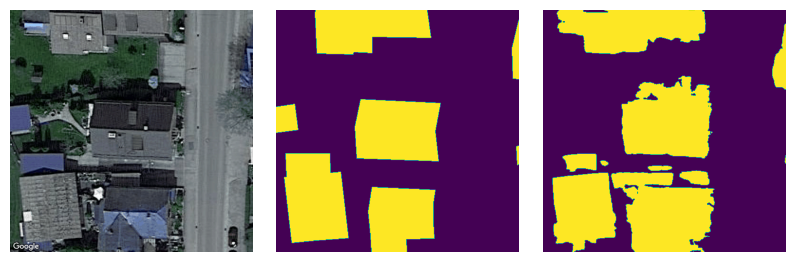

Processed image 1141, partial mean iou: 0.7387810260686103


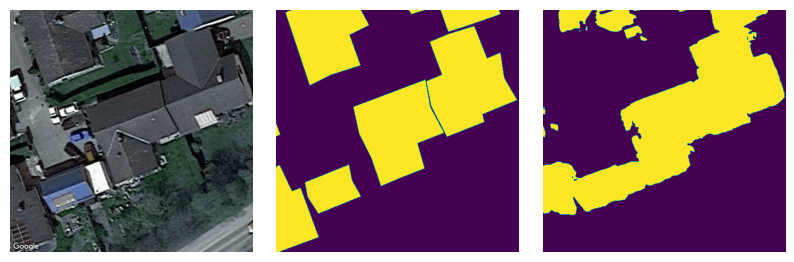

Processed image 1782, partial mean iou: 0.7417842274841848


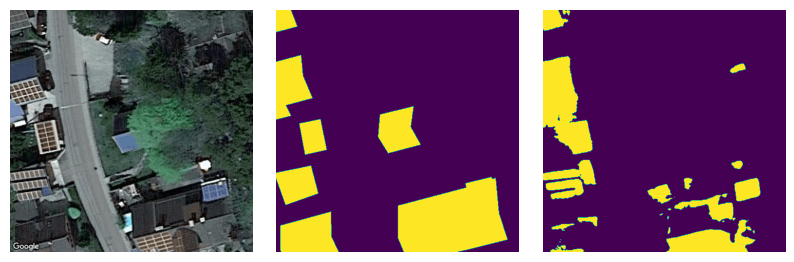

Processed image 1329, partial mean iou: 0.7337655476268398


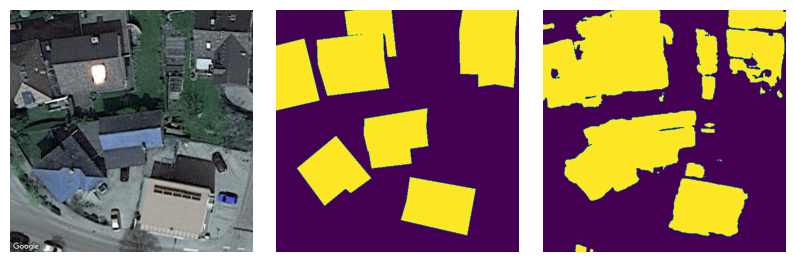

Processed image 1515, partial mean iou: 0.7396256124329323


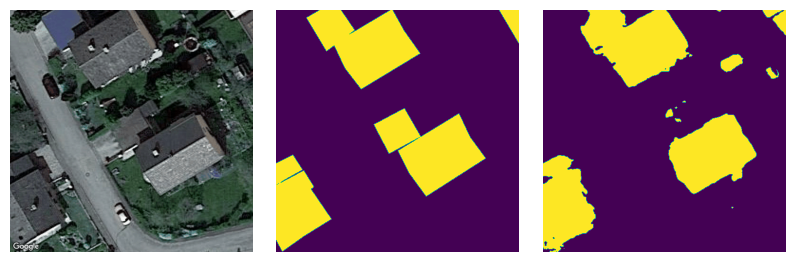

Processed image 52, partial mean iou: 0.7470448452180833


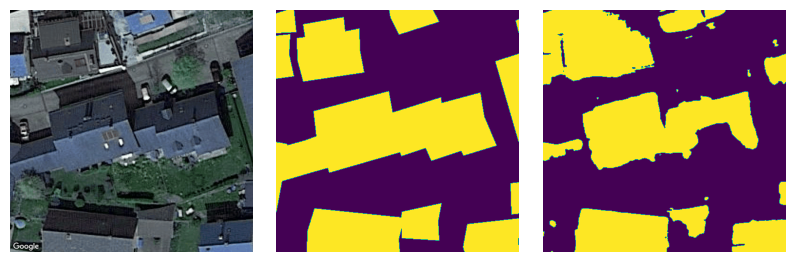

Processed image 1241, partial mean iou: 0.7509408066721222


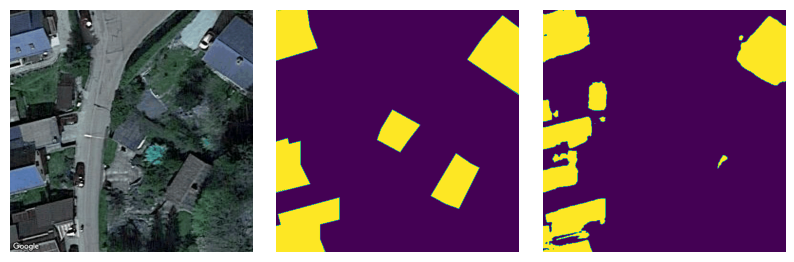

Processed image 1891, partial mean iou: 0.7500604751378541


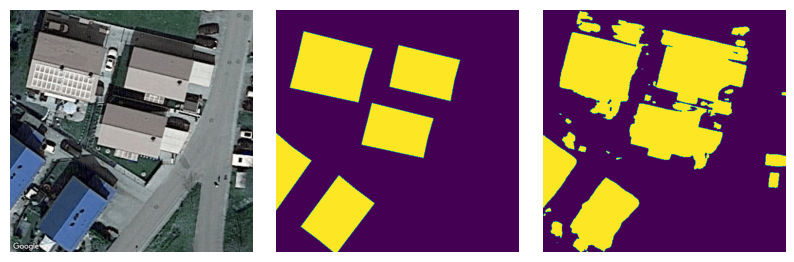

Processed image 302, partial mean iou: 0.7505854913379477


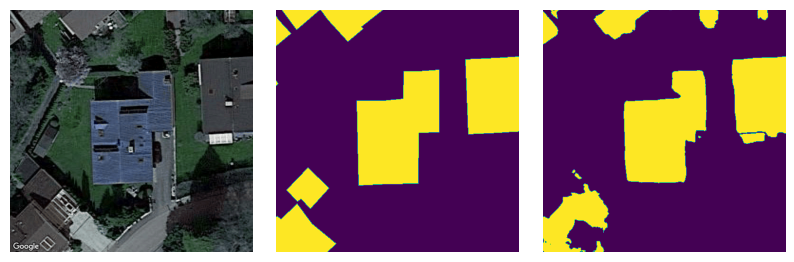

Processed image 475, partial mean iou: 0.7556379174678366


Elapsed time: 12.365981340408325 seconds
Final IoU per class: [0.85675356 0.65452227]
Final mean IoU: 0.7556379174678366
Mean IoU: 0.7556379174678366
IoU per class: [0.85675356 0.65452227]
Elapsed time: 12.365981340408325 seconds.


In [9]:
iou, mean_iou, elapsed_time = test_model_rid(model_inria_final,
                                                  rid_test_folder,
                                                  num_classes,
                                                  rid_background_class,
                                                  background_class,
                                                  ignore_index,
                                                  output=True)

print(f'Mean IoU: {mean_iou}')
print(f'IoU per class: {iou}')
print(f'Elapsed time: {elapsed_time} seconds.')

# AIRS

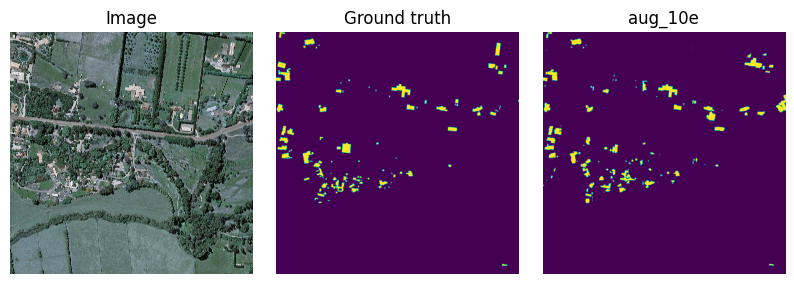

Processed image christchurch_442, partial mean iou: 0.755883774807892


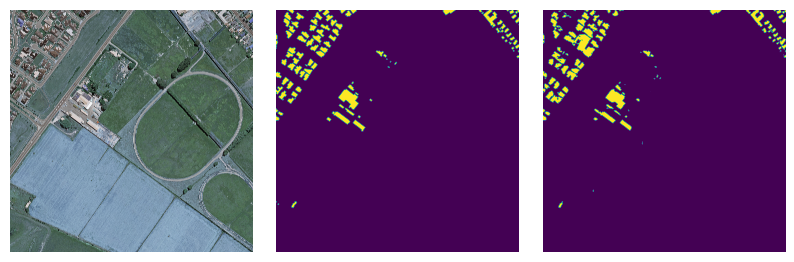

Processed image christchurch_397, partial mean iou: 0.805519060239626


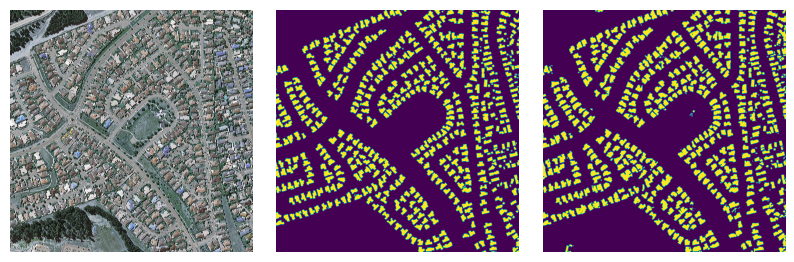

Processed image christchurch_821, partial mean iou: 0.8759722770136209


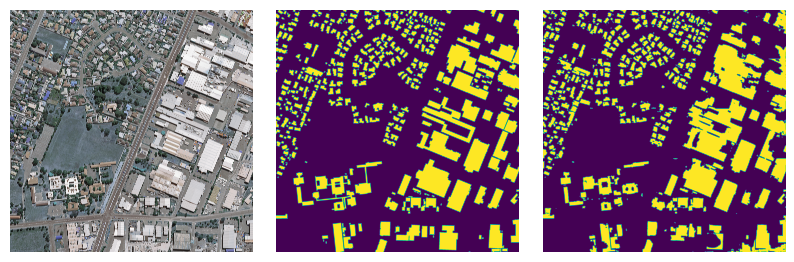

Processed image christchurch_236, partial mean iou: 0.8627934102232422


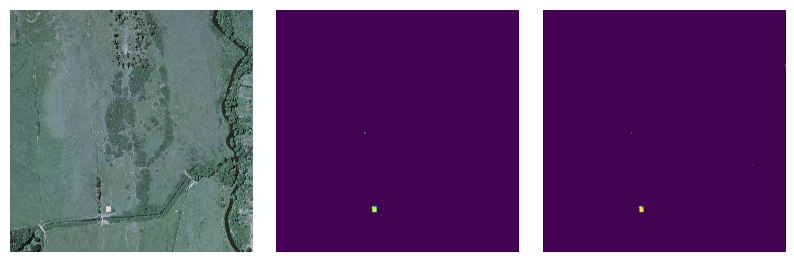

Processed image christchurch_810, partial mean iou: 0.8675204040034503


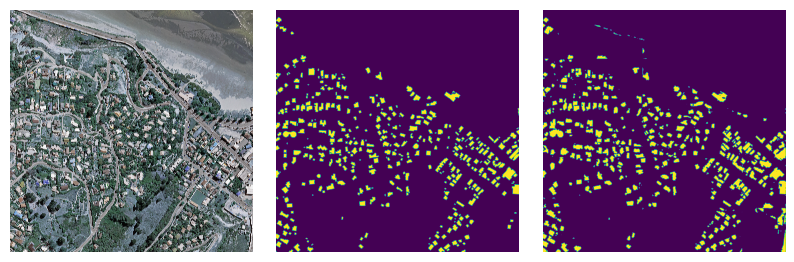

Processed image christchurch_1037, partial mean iou: 0.8591470508543821


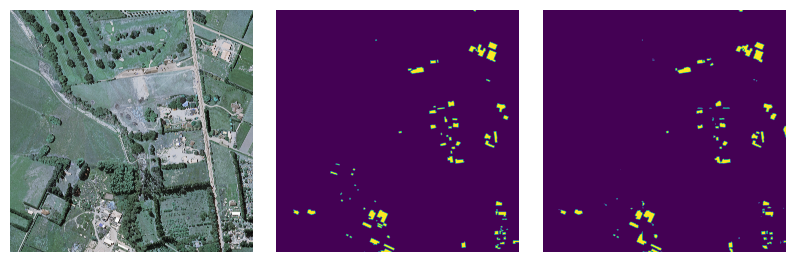

Processed image christchurch_669, partial mean iou: 0.8606953212999922


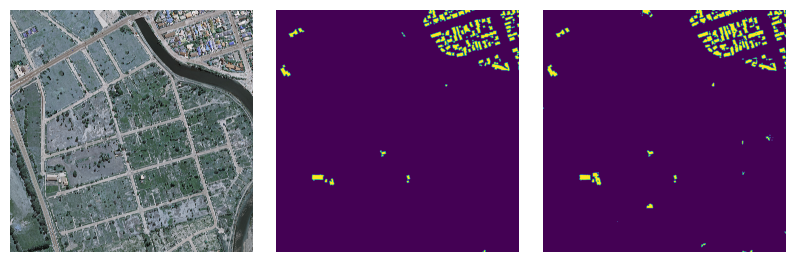

Processed image christchurch_965, partial mean iou: 0.8611932824703683


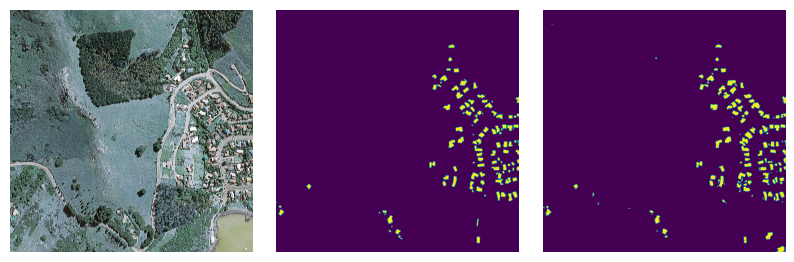

Processed image christchurch_842, partial mean iou: 0.861604542135323


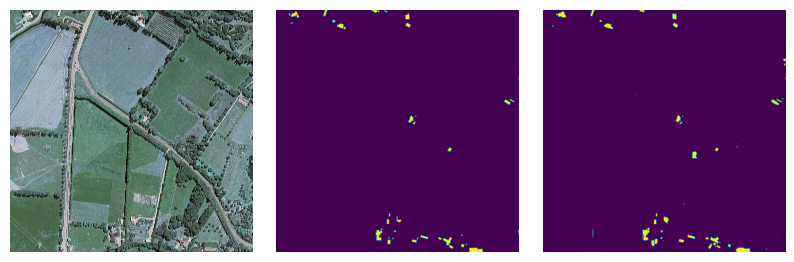

Processed image christchurch_344, partial mean iou: 0.8621705179907866


Elapsed time: 220.93048238754272 seconds
Final IoU per class: [0.9769426  0.74739844]
Final mean IoU: 0.8621705179907866
Mean IoU: 0.8621705179907866
IoU per class: [0.9769426  0.74739844]
Elapsed time: 220.93048238754272 seconds.


In [10]:
iou, mean_iou, elapsed_time = test_model_airs(model_inria_final,
                                              airs_test_path,
                                              scale_percent,
                                              num_classes,
                                              background_class,
                                              ignore_index,
                                              output=True,
                                              n_samples=10)

print(f'Mean IoU: {mean_iou}')
print(f'IoU per class: {iou}')
print(f'Elapsed time: {elapsed_time} seconds.')

# Aachen

In [11]:
data_path = pathlib.Path('../data')
aachen_df = pd.read_csv(data_path / 'aachen_model.csv', index_col=0)

aachen_path = pathlib.Path('../../workflow/output/aachen-intersection-z19/satellite')

/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3433: DtypeWarning: Columns (1,4,5,9,13,15) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [12]:
aachen_df = aachen_df.dropna(subset=['ST_AsText_1'])

gs = gpd.GeoSeries.from_wkt(aachen_df['ST_AsText_1'])
aachen_gdf = gpd.GeoDataFrame(aachen_df, geometry=gs, crs="EPSG:4326")

def utm_to_latlon(x, y, z=None):
    aachen_utm_number, aachen_utm_letter = 32, 'U'
    return utm.to_latlon(x, y, aachen_utm_number, aachen_utm_letter)
aachen_gdf['polygon_latlon'] = aachen_gdf['geometry'].apply(lambda x: shapely.ops.transform(utm_to_latlon, x))
aachen_gdf = aachen_gdf.set_geometry('polygon_latlon')


def latlon_to_xy(x, y, z=None):
    zoom_level = 19
    return passion.util.gis.latlon_toXY(x, y, zoom_level)
aachen_gdf['polygon_xy'] = aachen_gdf['polygon_latlon'].apply(lambda x: shapely.ops.transform(latlon_to_xy, x))
aachen_gdf = aachen_gdf.set_geometry('polygon_xy')

  0%|                                                                          | 0/10 [00:00<?, ?it/s]/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


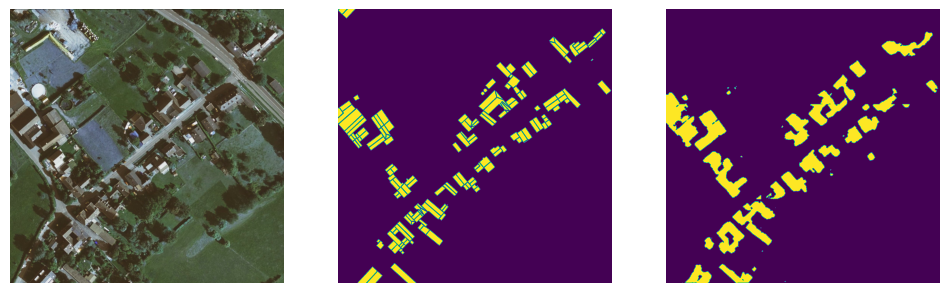

 10%|██████▌                                                           | 1/10 [00:09<01:22,  9.12s/it]

Partial iou: [0.95619438 0.51945599]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


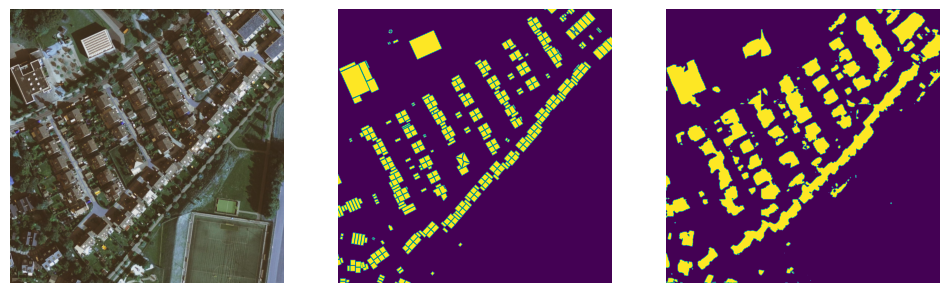

 20%|█████████████▏                                                    | 2/10 [00:17<01:10,  8.79s/it]

Partial iou: [0.92758905 0.47043489]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


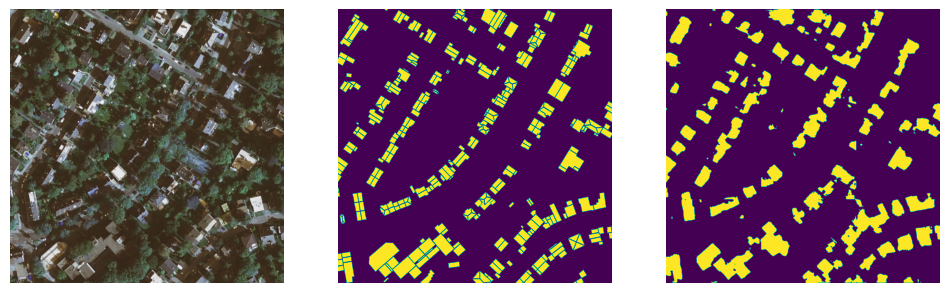

 30%|███████████████████▊                                              | 3/10 [00:26<01:00,  8.66s/it]

Partial iou: [0.91690648 0.50165817]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


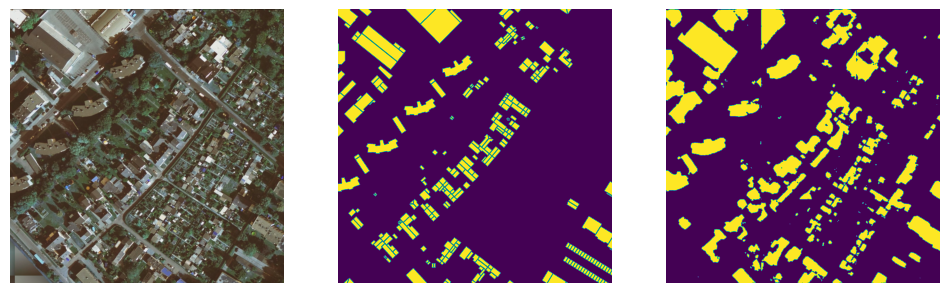

 40%|██████████████████████████▍                                       | 4/10 [00:34<00:51,  8.66s/it]

Partial iou: [0.90315967 0.48762609]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


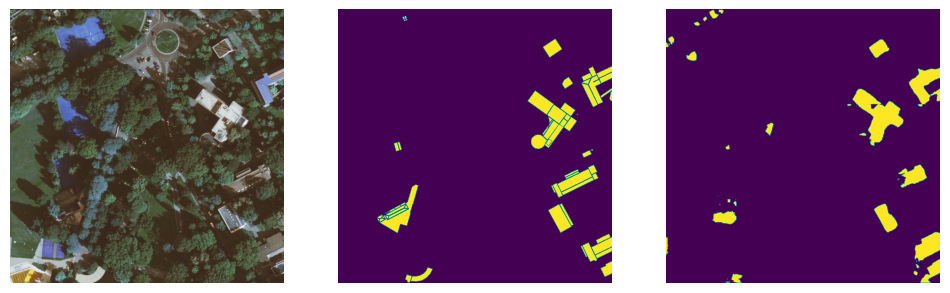

 50%|█████████████████████████████████                                 | 5/10 [00:43<00:43,  8.61s/it]

Partial iou: [0.91224792 0.50109134]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


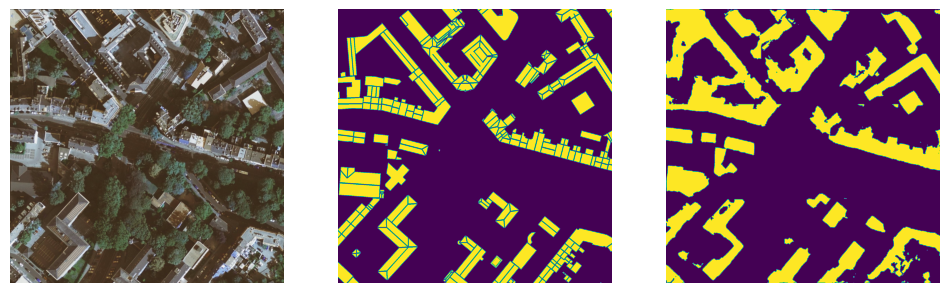

 60%|███████████████████████████████████████▌                          | 6/10 [00:52<00:34,  8.67s/it]

Partial iou: [0.9002145  0.53057979]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


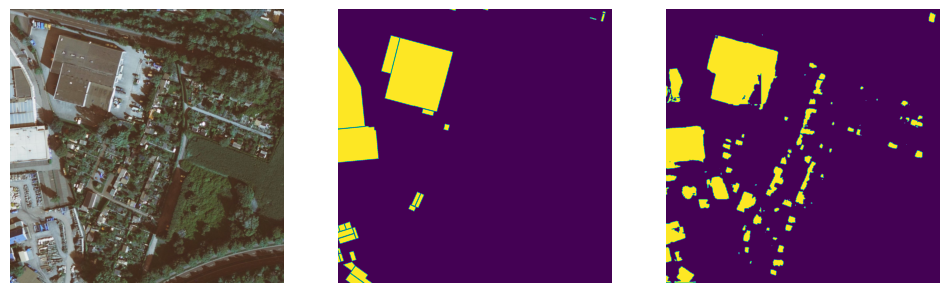

 70%|██████████████████████████████████████████████▏                   | 7/10 [01:00<00:26,  8.67s/it]

Partial iou: [0.90697683 0.53347943]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


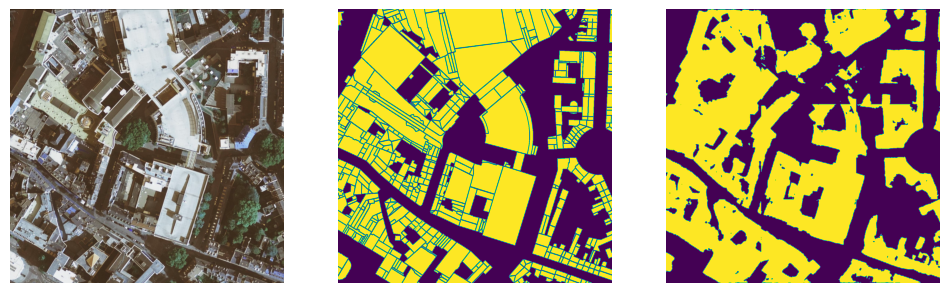

 80%|████████████████████████████████████████████████████▊             | 8/10 [01:10<00:18,  9.03s/it]

Partial iou: [0.87838613 0.56476788]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


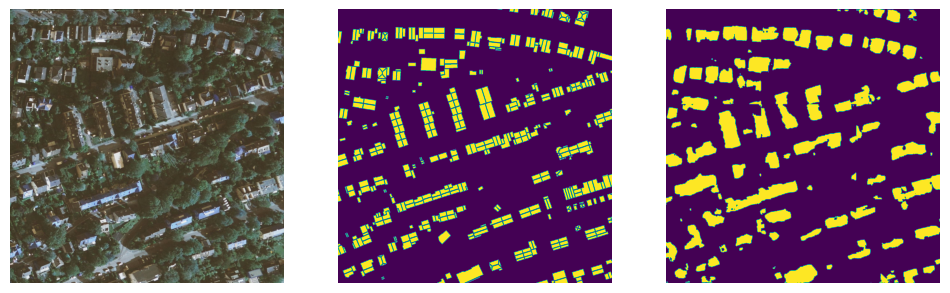

 90%|███████████████████████████████████████████████████████████▍      | 9/10 [01:20<00:09,  9.30s/it]

Partial iou: [0.87418055 0.54806715]


/storage/internal/home/r-pueblas/.conda/envs/passion-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


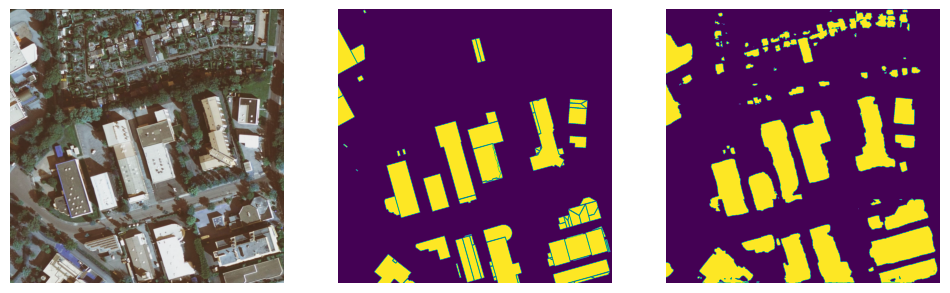

100%|█████████████████████████████████████████████████████████████████| 10/10 [01:29<00:00,  8.92s/it]

Partial iou: [0.87418337 0.54900534]


In [13]:
# Randomly selected samples with significative amount of buildings
names = [
    '50D42M57338SNORTH_06D09M55075SEAST_19L.tif',
    '50D44M54530SNORTH_06D09M16451SEAST_19L.tif',
    '50D45M03541SNORTH_06D05M24709SEAST_19L.tif',
    '50D45M30572SNORTH_06D08M18516SEAST_19L.tif',
    '50D45M39582SNORTH_06D04M26773SEAST_19L.tif',
    '50D46M06607SNORTH_06D05M05397SEAST_19L.tif',
    '50D46M15615SNORTH_06D07M59204SEAST_19L.tif',
    '50D46M24622SNORTH_06D05M24709SEAST_19L.tif',
    '50D46M33628SNORTH_06D03M48149SEAST_19L.tif',
    '50D47M00645SNORTH_06D07M59204SEAST_19L.tif'
]

num_classes = 2

total_area_intersect = np.zeros((num_classes, ), dtype=float)
total_area_union = np.zeros((num_classes, ), dtype=float)
total_area_pred_label = np.zeros((num_classes, ), dtype=float)
total_area_label = np.zeros((num_classes, ), dtype=float)

for name in tqdm(names):
    img_path = aachen_path / name
    
    src = passion.util.io.read_geotiff(img_path)
    img = src.ReadAsArray()
    
    west, xres, xskew, north, yskew, yres  = rooftop_src.GetGeoTransform()
    east = west + (rooftop_src.RasterXSize * xres)
    south = north + (rooftop_src.RasterYSize * yres)
    
    img_bbox = shapely.geometry.box(west, south, east, north)
    
    img_gdf = aachen_gdf[aachen_gdf.geometry.intersects(img_bbox)]
    
    min_x, min_y = west, south
    
    def rel_xy(x, y, z=None):
        return int(x-min_x), (y-min_y)
    
    img_gdf['rel_geometry'] = img_gdf.geometry.apply(lambda x: shapely.ops.transform(rel_xy, x))
    
    img_polygons = img_gdf['rel_geometry']
    img_classes = len(img_polygons) * [1]
    
    mask_img = passion.util.shapes.outlines_to_image(img_polygons, img_classes, img.shape)
    pred = passion.segmentation.prediction.segment_img(img, model_inria_aug_10e, tile_size=512, stride=512, background_class=0)
    
    
    h, w, c = img.shape
    crop = min(h,w)
    
    fig, ax = plt.subplots(1, 3, figsize=(12,4))
    ax[0].axis('off')
    ax[1].axis('off')
    ax[2].axis('off')

    ax[0].imshow(img[:crop,:crop,:])
    ax[1].imshow(mask_img[:crop,:crop])
    ax[2].imshow(pred[:crop,:crop])
    plt.show()
    
    area_intersect, area_union, area_pred_label, area_label = \
                            intersect_and_union(pred, mask_img, num_classes, -1)
    total_area_intersect += area_intersect
    total_area_union += area_union
    total_area_pred_label += area_pred_label
    total_area_label += area_label
    
    print(f'Partial iou: {total_area_intersect / total_area_union}')